# 1. plot all subjects accuracy on MNI template
1.1 after 0_6 erp binary classification, we have get all subjects accuracy results(include cue and read task acc) across all frequency band(save_acc_dir = f'/public/DATA/overt_reading/bands_acc'), the results save as dict, key=[band], values=[accuracy on 256 electrodes]

1.2 then we can load these data and plot these on a 2D brain, only if the accuracy > 0.5, we text it with{HS}_{elec_id}

In [22]:
import numpy as np
from sklearn.preprocessing import StandardScaler
import os
import sys
sys.path.append('../')
from ecog_band.utils import *
import pandas as pd
from sklearn.metrics import precision_score, recall_score, f1_score, classification_report, confusion_matrix
import torch
from torch.utils import data as Data
from sklearn.model_selection import GridSearchCV,train_test_split
import torch.nn as nn
import seaborn as sns
from matplotlib.colors import Normalize
from matplotlib.patches import Rectangle
import scipy.io as scio
import matplotlib.image as mpimg
import matplotlib as mpl
import matplotlib.patches as patches
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


bands_list = {
    'delta': (1, 4),
    'theta': (4, 8),
    'alpha': (8, 12),
    'beta': (12, 30),
    'gamma': (30, 70),
    'high gamma':(70,150),
    'else2':(150,min(400/2, 300))
}
HS_list = [45,47,48,50,54,71,76,78,73]
freq_list = [400]
mpl.rcParams['font.size'] =10

## 1.1 Plot the classification accuracy of all electrodes across subjects, with color intensity indicating accuracy level.

In [13]:
def load_all_subjects_acc(HS_list, freq_list, band):
    all_coords, all_values = [], []
    for HS in HS_list:
        for freq in freq_list:
            save_acc_path = f'/public/DATA/covert_reading/bands_acc/HS{HS}/{freq}'
            bands_acc = np.load(os.path.join(save_acc_path, 'bands_acc.npy'), allow_pickle=True).item()
            band_acc = bands_acc[band]
            subject_str = f"HS{HS}"
            
            # Load 3D electrode coordinates in MNI space
            path = '/public/DATA/covert_reading/'
            coords = scio.loadmat(path + f"/elecs/Brain2D/{subject_str}_elec_pos2D.mat")['elecmatrix']
           
            for i, acc in enumerate(band_acc):
                all_coords.append(coords[i])  # Append each electrode's coordinates
                all_values.append(acc)        # Append each electrode's accuracy

    return np.array(all_coords), np.array(all_values)

def plot_brain_surface_with_acc(all_coords, all_values, band, view_2D=True):
    if view_2D:
        # Load 2D brain image
        img = mpimg.imread("/public/DATA/covert_reading/elecs/MNI.png")
        plt.figure(figsize=(15, 15))
        plt.imshow(img)
        plt.scatter(all_coords[:, 0], all_coords[:, 1], c=all_values, cmap='Reds', alpha=0.7)
        plt.colorbar(label='Accuracy')
        plt.title(f'Electrode Accuracy across Subjects - Band: {band}')
        plt.axis('off')
        plt.show()
    else:
        # Plot 3D brain model
        fig = plt.figure(figsize=(15, 15))
        ax = fig.add_subplot(111, projection='3d')
        img = mpimg.imread('/public/DATA/covert_reading/elecs/Brain3D/MNI152_brain3D.png')
        
        sc = ax.scatter(all_coords[:, 0], all_coords[:, 1], all_coords[:, 2], c=all_values, cmap='Reds', alpha=0.7)
        fig.colorbar(sc, ax=ax, label='Accuracy')
        
        ax.set_xlabel('X (MNI)')
        ax.set_ylabel('Y (MNI)')
        ax.set_zlabel('Z (MNI)')
        ax.set_title(f'3D Electrode Accuracy across Subjects - Band: {band}')
        plt.show()


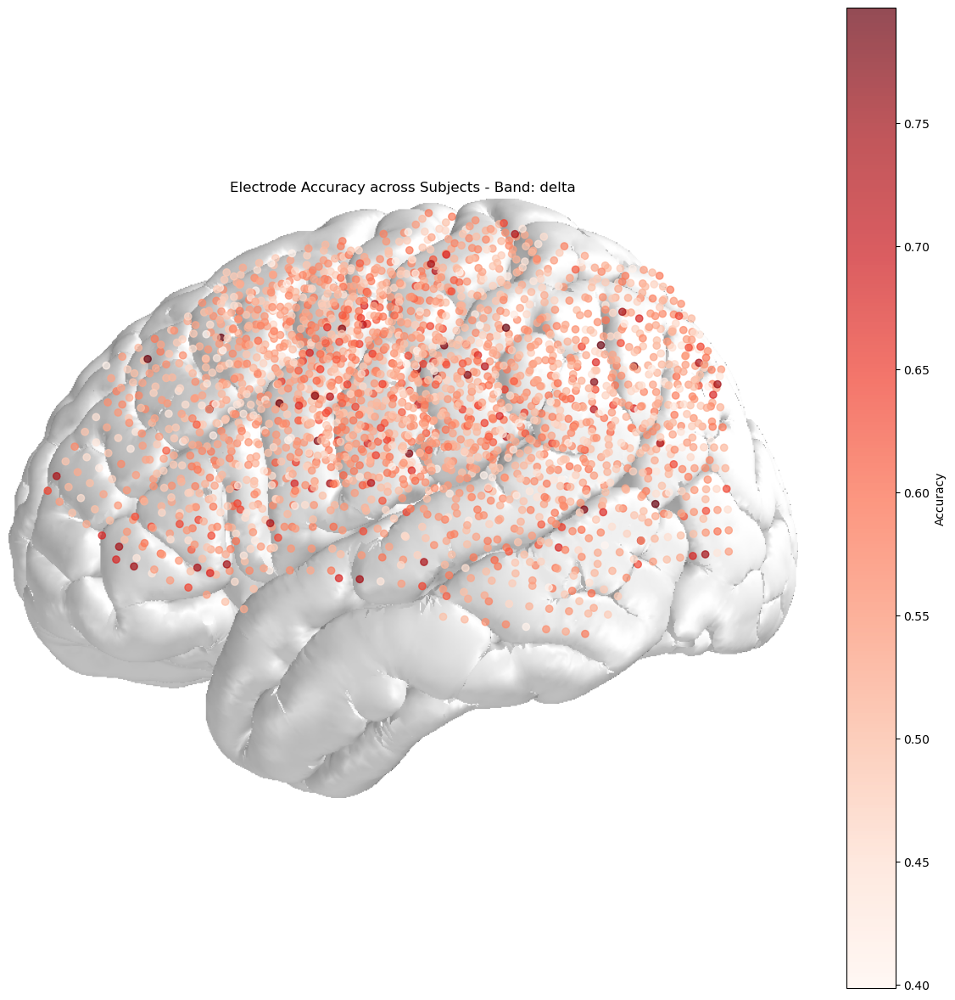

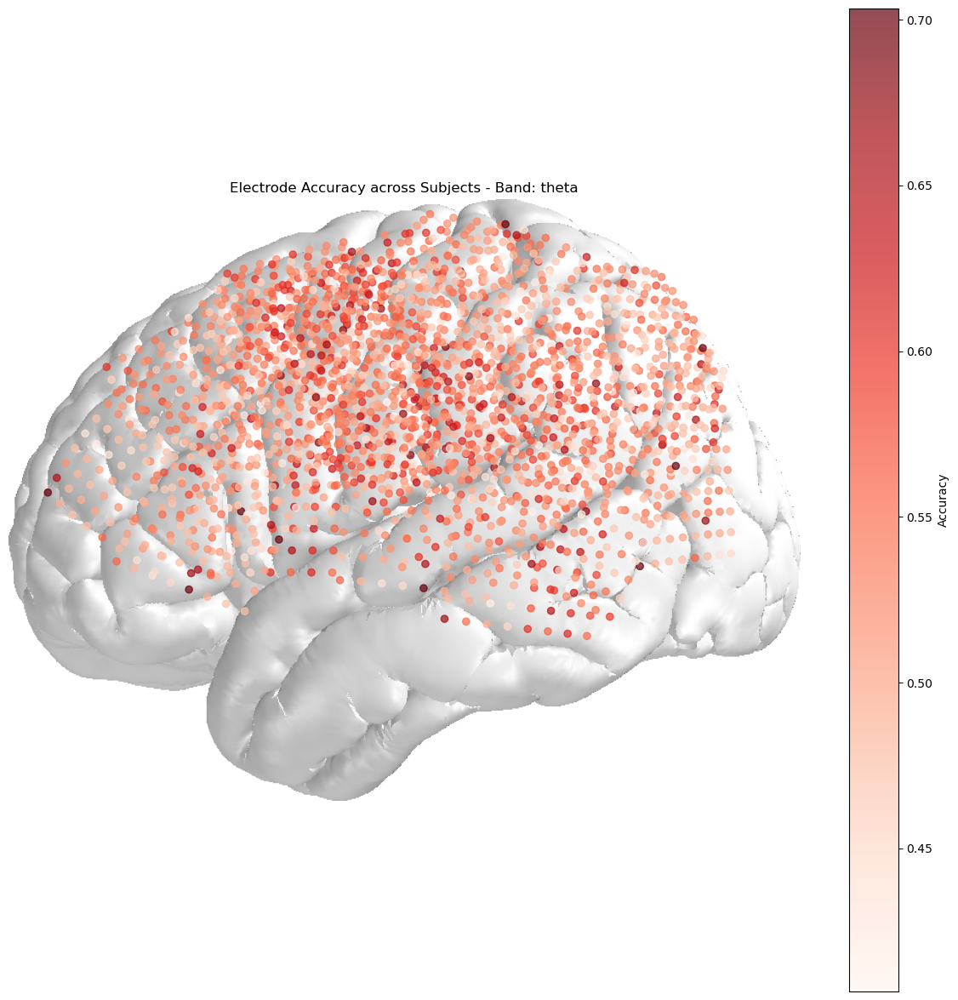

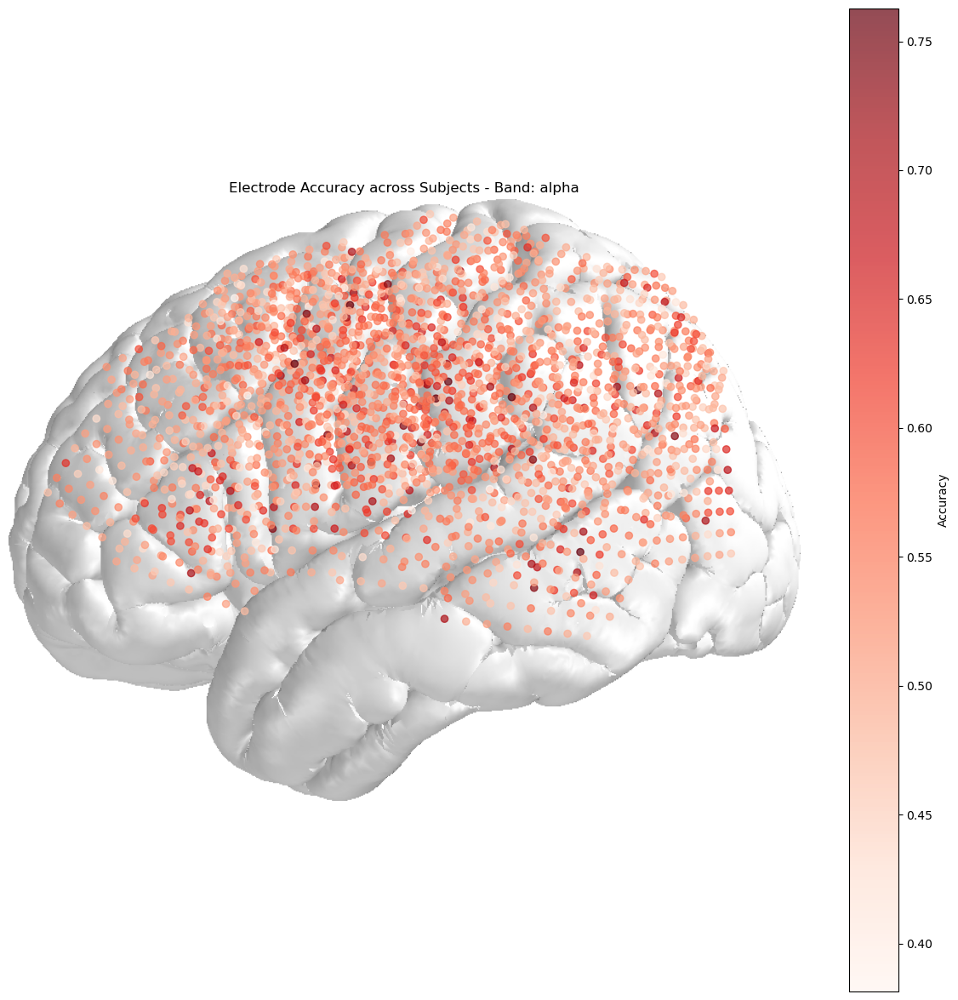

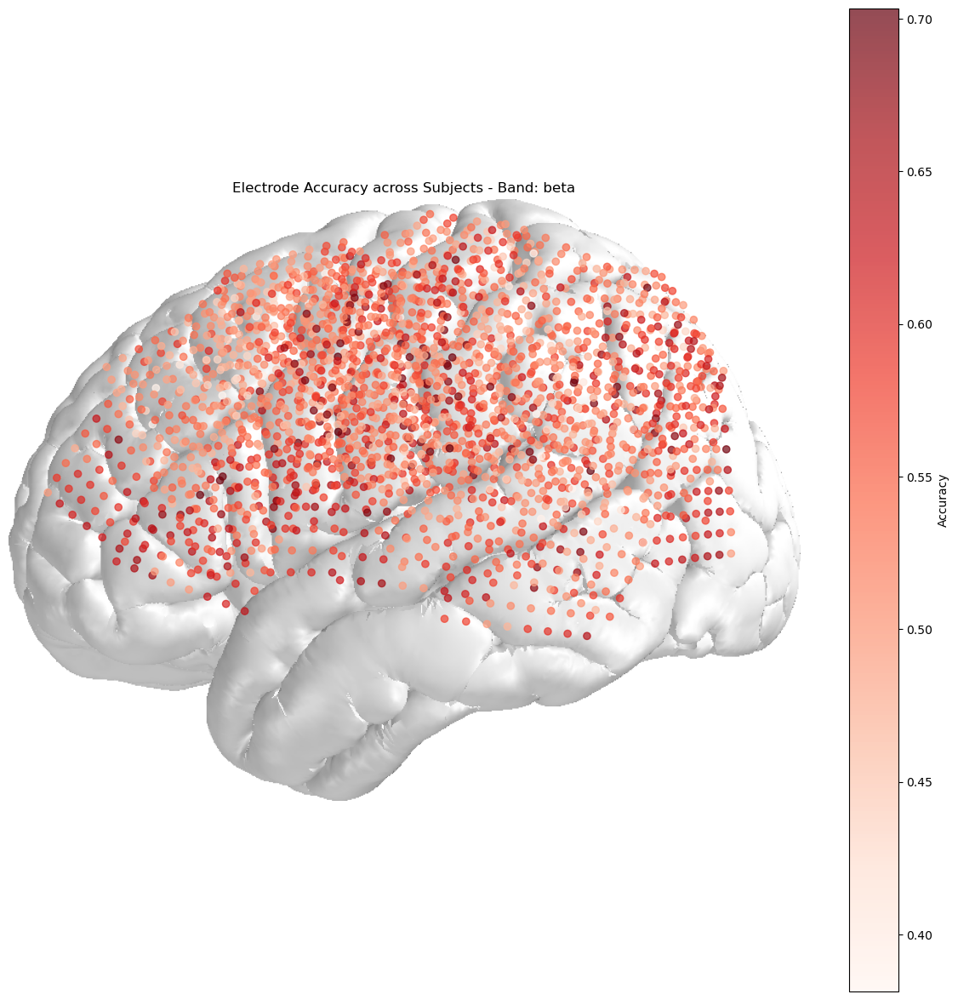

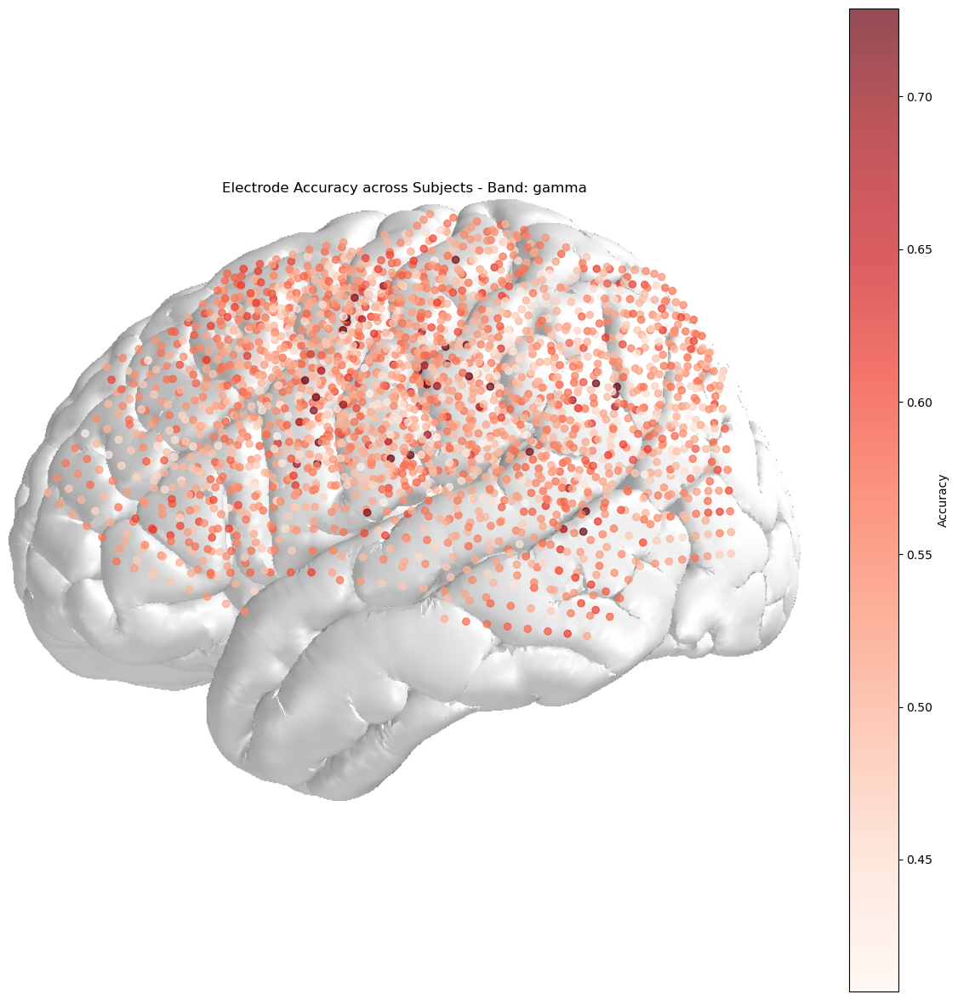

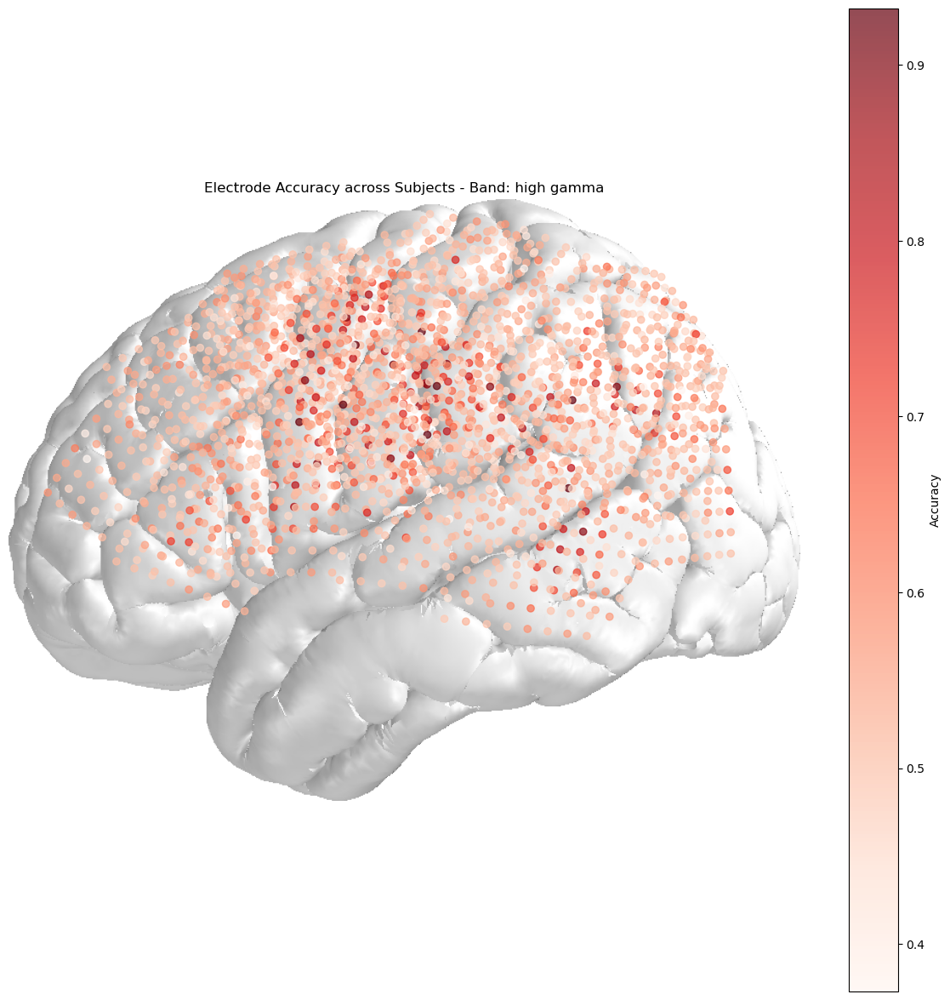

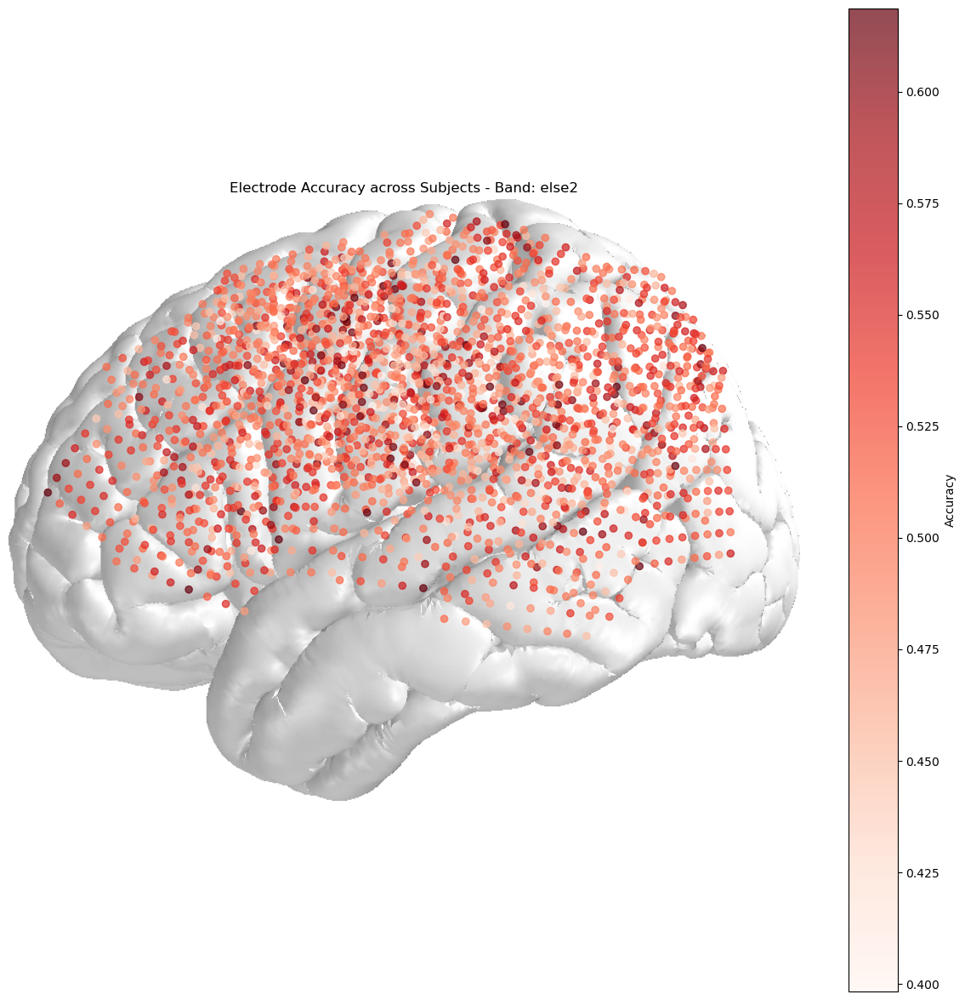

In [14]:
for band in bands_list.keys():
    all_coords, all_values = load_all_subjects_acc(HS_list, freq_list, band)
    # Plot accuracy on brain surface
    plot_brain_surface_with_acc(all_coords, all_values, band, view_2D=True)

## 1.2 Plot the classification accuracy of all electrodes, with color intensity representing accuracy level and different colors indicating individual subjects.

In [20]:
import matplotlib.cm as cm

# 添加右侧颜色条函数
def add_right_cax(ax, pad, width):
    axpos = ax.get_position()
    caxpos = mpl.transforms.Bbox.from_extents(
        axpos.x1 + pad,
        axpos.y0,
        axpos.x1 + pad + width,
        axpos.y1
    )
    cax = ax.figure.add_axes(caxpos)
    return cax

# 绘制多个被试的电极准确率在标准脑模板上
def plot_multiple_subjects_acc_brain(HS_list, freq, band):
    path = '/public/DATA/covert_reading/'
    fig, ax = plt.subplots(figsize=(15, 15))
    img = mpimg.imread(path + "/elecs/MNI.png")
    ax.imshow(img)
    
    # 为每个被试生成不同颜色
    # colors = cm.get_cmap('tab20', len(HS_list))
    # colors = cm.get_cmap('Set3', len(HS_list))
    colors = cm.get_cmap('viridis', len(HS_list))  # 更改为viridis
    legend_handles = []

    for i, HS in enumerate(HS_list):
        color = colors(i)  # 每个被试一个颜色
        save_acc_path = os.path.join(f'/public/DATA/covert_reading/bands_acc', f'HS{HS}', f'{freq}')
        bands_acc = np.load(os.path.join(save_acc_path, 'bands_acc.npy'), allow_pickle=True).item()
        band_acc = bands_acc[band]

        # 加载电极位置和解剖信息
        subject_str = f"HS{HS}"
        xy = scio.loadmat(path + f"/elecs/Brain2D/{subject_str}_elec_pos2D.mat")['elecmatrix']
        # anatomy = scio.loadmat(path + f"/elecs/Brain2D/{subject_str}_elec_pos2D.mat")['anatomy']

        x_coords, y_coords, values = [], [], []
        electrode_count = 0
        for elec, acc in enumerate(band_acc):
            x_coords.append(xy[elec][0])
            y_coords.append(xy[elec][1])
            values.append(acc)

            if acc > 0.6:  # 高于阈值的电极标记
                plt.text(xy[elec][0], xy[elec][1], f"{HS}_{elec}", color=color)
                electrode_count += 1

        # 绘制当前被试的电极位置
        scatter = ax.scatter(x_coords, y_coords, c=values, cmap='Reds', alpha=0.7, label=f'Subject HS{HS}', edgecolor=color)
        legend_handles.append(scatter)

    # 配置图例显示每个被试的颜色标记
    ax.legend(handles=legend_handles, title="Subjects", loc='upper right', fontsize=10, title_fontsize=12)

    # 配置颜色条
    cax = add_right_cax(ax, pad=0.02, width=0.02)
    cbar = fig.colorbar(scatter, cax=cax)
    plt.grid(False)
    plt.axis('off')
    plt.title(f'Electrode accuracy for each subject on {band}')
    plt.show()

/tmp/ipykernel_8214/496961413.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('viridis', len(HS_list))  # 更改为viridis


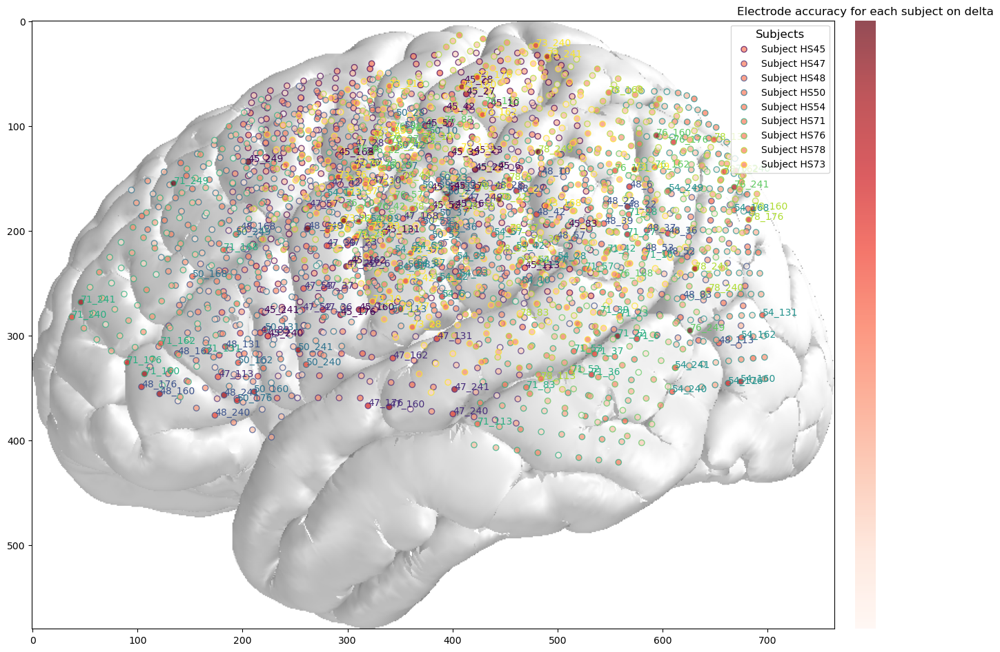

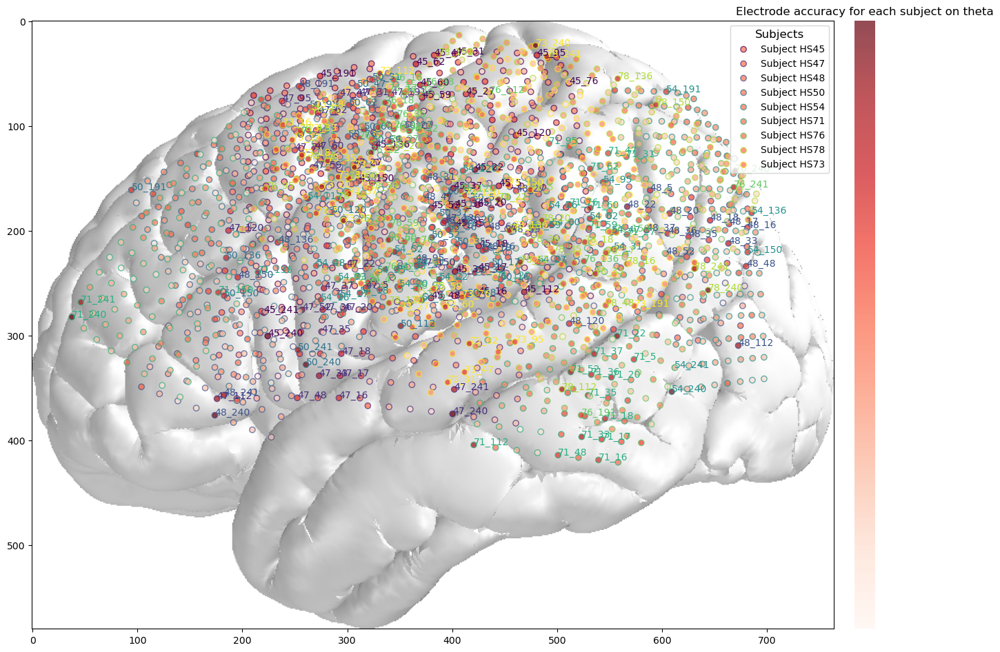

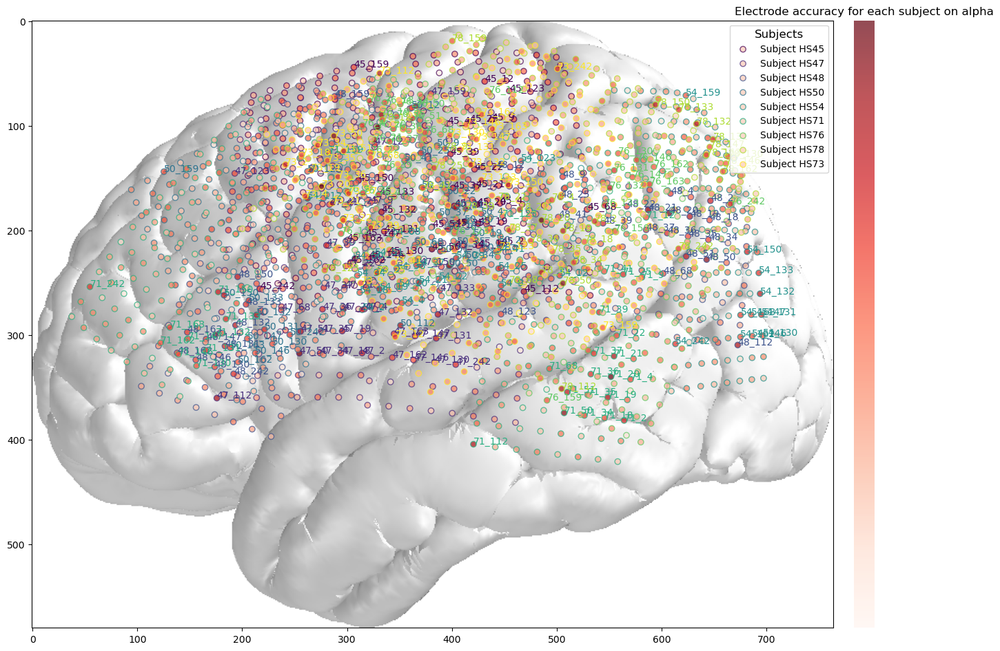

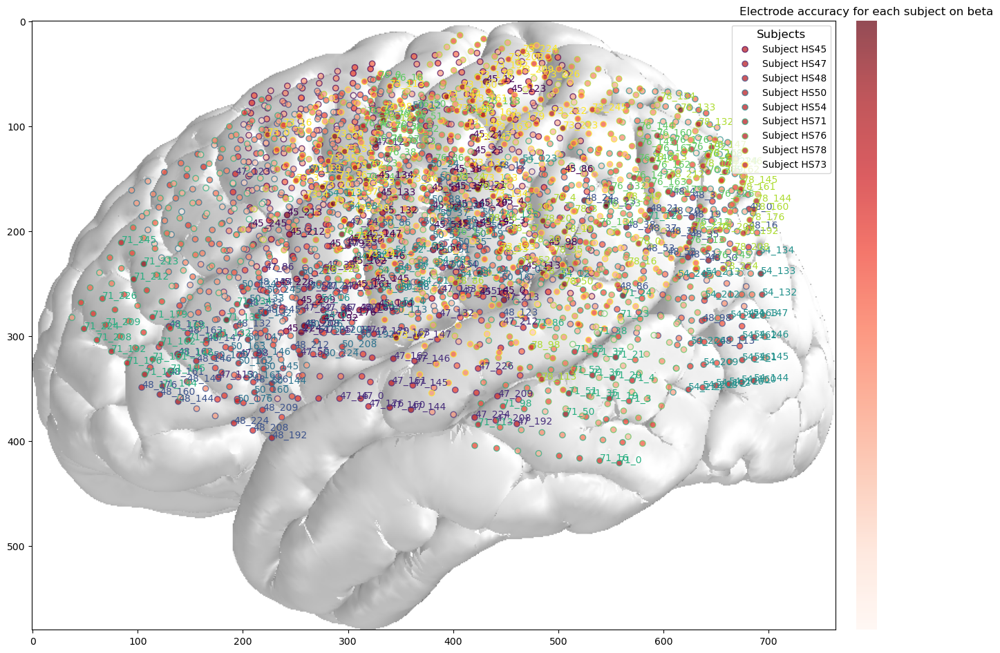

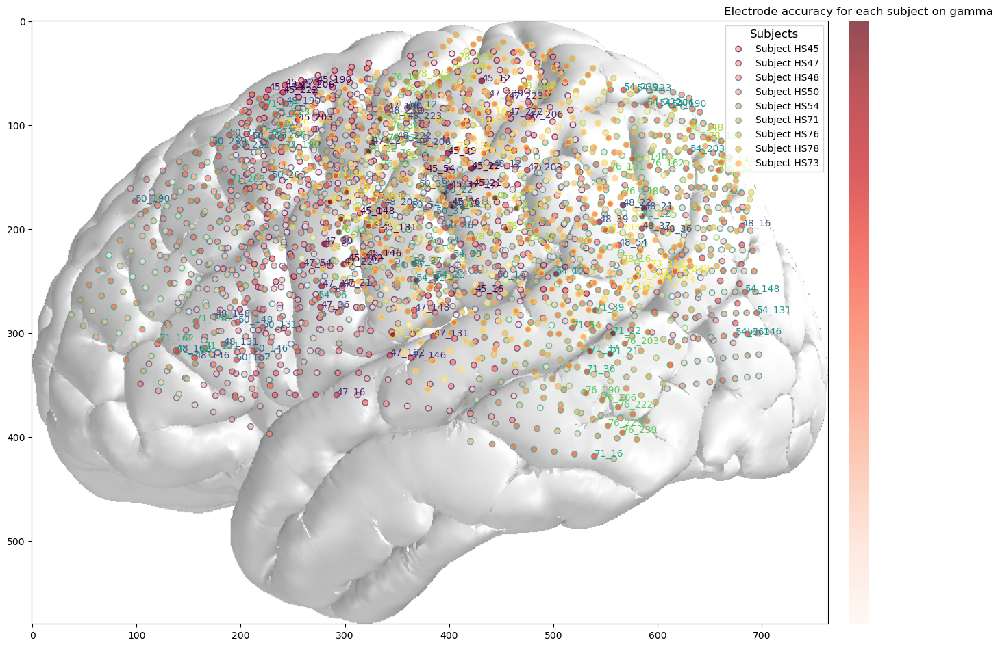

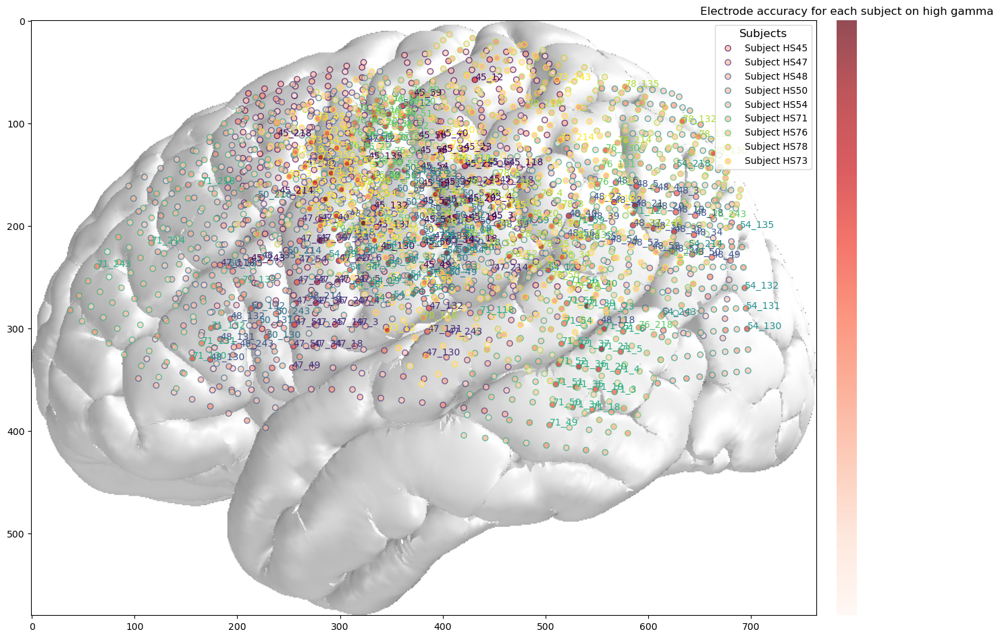

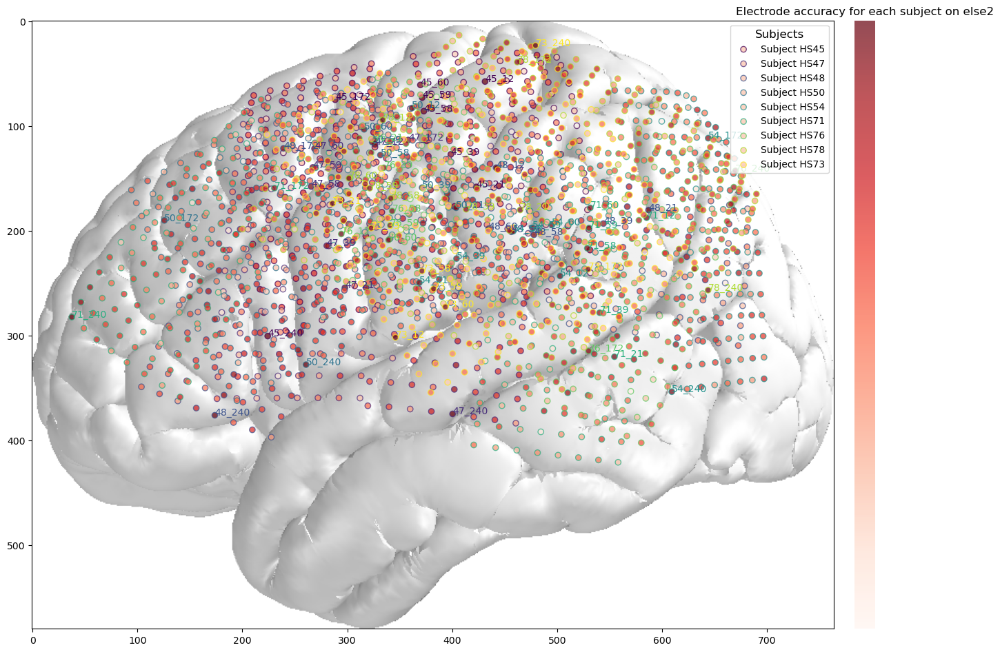

In [21]:
for freq in freq_list:
    for band in bands_list.keys():
        plot_multiple_subjects_acc_brain(HS_list, freq, band)


## 1.3 The percentage of acc>0.5 electrodes in each brain region relative to the total significant electrodes for each frequency band

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from collections import defaultdict

def analyze_and_plot_electrode_acc(subjects_data, bands_list, threshold=0.5):
    """
    统计并可视化所有被试中不同band在不同脑区的电极准确率分布。
    
    参数:
    - subjects_data: dict，每个被试的电极数据，格式为 {subject: {band: [acc1, acc2, ...]}}
    - bands_list: list，所有频段的列表，例如 ['delta', 'theta', 'alpha', 'beta', 'gamma']
    - anatomy: dict，每个电极对应的脑区信息，格式为 {elec: [..., ..., ..., [区域名, ...]]}
    - threshold: float，准确率阈值，默认为 0.5
    
    返回:
    - region_count_by_band: dict，统计结果
    """
    # 初始化统计结果
    region_count_by_band = {band: defaultdict(int) for band in bands_list}

    # 遍历所有被试和频段
    for HS, subject_data in subjects_data.items():
        anatomy = scio.loadmat(f"/public/DATA/covert_reading/elecs/warped/HS{HS}_elecs_all_warped.mat")['anatomy']

        for band, acc_list in subject_data.items():
            for elec, acc in enumerate(acc_list):
                if acc > threshold:  # 筛选准确率 > 阈值的电极
                    region = anatomy[elec][3][0]  # 获取脑区
                    region_count_by_band[band][region] += 1
    return region_count_by_band


def plot_electrode_acc_across_band(region_count_by_band):
    # 转换为 DataFrame，方便绘制
    df = pd.DataFrame(region_count_by_band).fillna(0)
    df = df.astype(int)  # 确保数据为整数类型

    # 绘制堆叠柱状图
    ax = df.plot(kind='bar', stacked=True, figsize=(12, 8), colormap='tab10')
    plt.xlabel('Brain Regions')
    plt.ylabel('Number of Electrodes (ACC > 0.5)')
    plt.title('Electrode Accuracy Distribution by Band and Brain Region')
    plt.legend(title='Frequency Bands', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


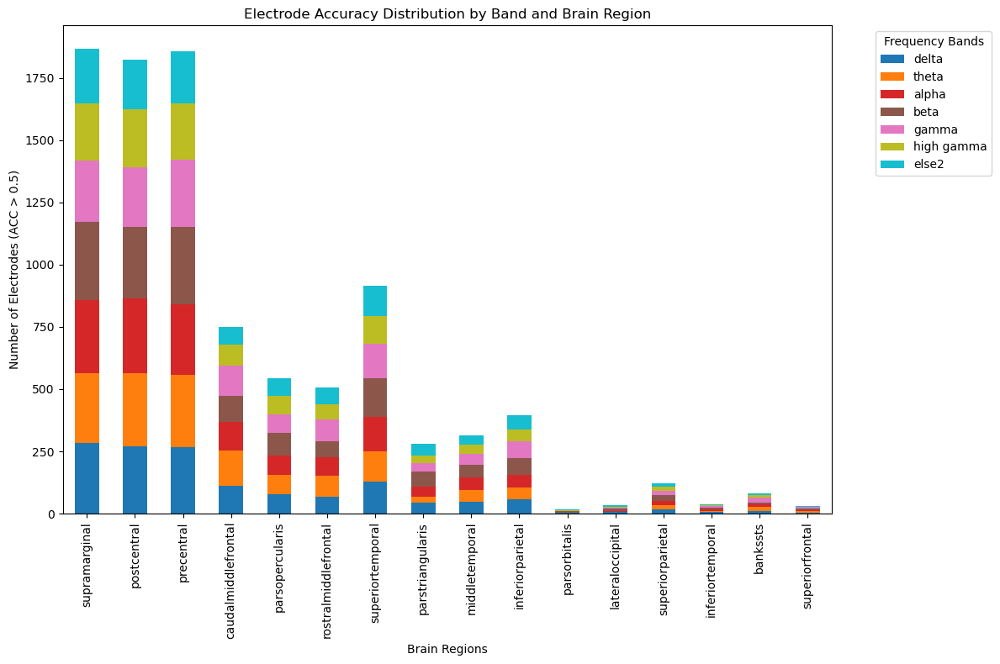

In [25]:
subjects_data = {}
for HS in HS_list:
    for freq in freq_list:
        save_acc_path = f'/public/DATA/covert_reading/bands_acc/HS{HS}/{freq}'
        bands_acc = np.load(os.path.join(save_acc_path, 'bands_acc.npy'), allow_pickle=True).item()
        subjects_data[HS] = bands_acc
        
region_count_by_band = analyze_and_plot_electrode_acc(subjects_data, bands_list, threshold=0.5)  
plot_electrode_acc_across_band(region_count_by_band)

In [34]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from collections import defaultdict

def analyze_electrode_acc(subjects_data, bands_list, threshold=0.5):
    """
    统计并可视化所有被试中不同band在不同脑区的电极准确率分布。
    
    参数:
    - subjects_data: dict，每个被试的电极数据，格式为 {subject: {band: [acc1, acc2, ...]}}
    - bands_list: list，所有频段的列表，例如 ['delta', 'theta', 'alpha', 'beta', 'gamma']
    - anatomy: dict，每个电极对应的脑区信息，格式为 {elec: [..., ..., ..., [区域名, ...]]}
    - threshold: float，准确率阈值，默认为 0.5
    
    返回:
    - region_count_by_band: dict，统计结果
    """
    # 初始化统计结果
    region_count_by_band = {band: defaultdict(int) for band in bands_list}

    # 遍历所有被试和频段
    for HS, subject_data in subjects_data.items():
        anatomy = scio.loadmat(f"/public/DATA/covert_reading/elecs/warped/HS{HS}_elecs_all_warped.mat")['anatomy']

        for band, acc_list in subject_data.items():
            for elec, acc in enumerate(acc_list):
                if acc > threshold:  # 筛选准确率 > 阈值的电极
                    region = anatomy[elec][3][0]  # 获取脑区
                    region_count_by_band[band][region] += 1
    return region_count_by_band


def plot_electrode_acc_across_band(region_count_by_band, threshold):
    # 转换为 DataFrame
    df = pd.DataFrame(region_count_by_band).fillna(0).T  # 将频段转置为行索引，脑区为列索引
    df = df.T  # 转置，使脑区为行索引，频段为列索引
    df_percentage = df.div(df.sum(axis=1), axis=0) * 100  # 计算每个脑区内频段的百分比

    # 绘制堆叠柱状图
    fig, ax = plt.subplots(figsize=(15, 8))
    bottoms = np.zeros(len(df.index))  # 初始堆叠底部

    for band in df.columns:
        ax.bar(df.index, df[band], bottom=bottoms, label=band)
        bottoms += df[band]

        # 添加百分比标注
        for i, (value, percent) in enumerate(zip(df[band], df_percentage[band])):
            if percent > 1:  # 只显示超过1%的标签
                ax.text(i, bottoms[i] - value / 2, f'{percent:.1f}%', ha='center', va='center', color='white', fontsize=8)

    # 图例和标签
    plt.xlabel('Brain Regions')
    plt.ylabel('Number of Electrodes (acc > threshold)')
    plt.title('Distribution of High-Accuracy Electrodes by Brain Region and Frequency Band')
    plt.xticks(rotation=45, ha='right')  # 旋转脑区标签
    plt.legend(title='Frequency Bands', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


/tmp/ipykernel_8214/2936140178.py:51: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.text(i, bottoms[i] - value / 2, f'{percent:.1f}%', ha='center', va='center', color='white', fontsize=8)


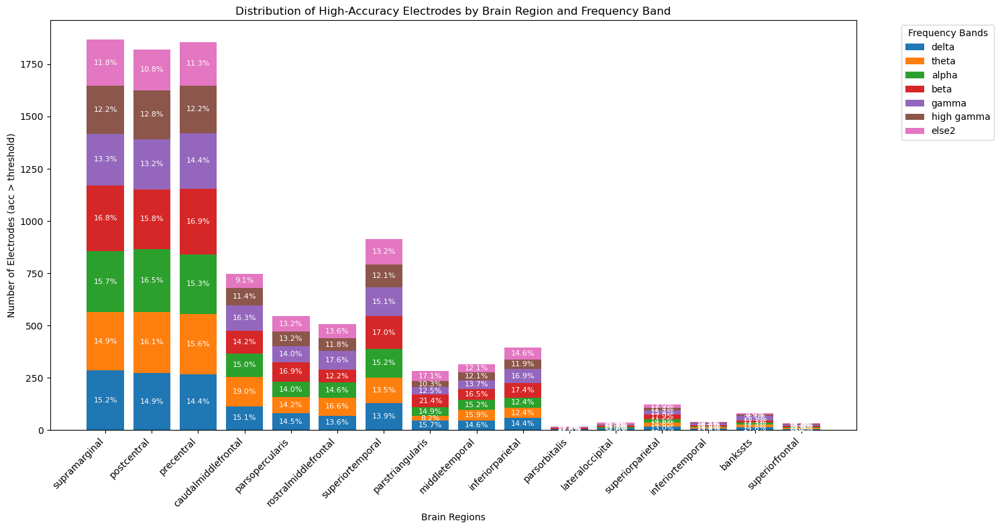

In [35]:
subjects_data = {}
for HS in HS_list:
    for freq in freq_list:
        save_acc_path = f'/public/DATA/covert_reading/bands_acc/HS{HS}/{freq}'
        bands_acc = np.load(os.path.join(save_acc_path, 'bands_acc.npy'), allow_pickle=True).item()
        subjects_data[HS] = bands_acc
        
region_count_by_band = analyze_electrode_acc(subjects_data, bands_list, threshold=0.5)  
plot_electrode_acc_across_band(region_count_by_band, threshold=0.5)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict
import scipy.io as scio

def analysis_acc_per_band(subjects_data, bands_list, threshold=0.5):
    # 初始化统计数据
    band_count_by_region = {band: defaultdict(int) for band in bands_list}
    band_total_count = defaultdict(int)

    # 遍历所有被试，统计数据
    for HS, subject_data in subjects_data.items():
        anatomy = scio.loadmat(f"/public/DATA/covert_reading/elecs/warped/HS{HS}_elecs_all_warped.mat")['anatomy']

        for band, acc_list in subject_data.items():
            for elec, acc in enumerate(acc_list):
                region = anatomy[elec][3][0]  # 获取电极所在的脑区
                band_total_count[band] += 1  # 统计每个频段的总电极数
                if acc > threshold:  # 筛选高准确率电极
                    band_count_by_region[band][region] += 1

    # 计算比例
    band_high_acc_percentage = {}
    for band in band_total_count:
        high_acc_count = sum(
            band_count_by_region[band].get(region, 0) for region in band_count_by_region[band]
        )
        band_high_acc_percentage[band] = high_acc_count / band_total_count[band]

    return band_count_by_region, band_high_acc_percentage


def plot_acc_distribution_per_band(band_count_by_region, band_high_acc_percentage):
    # 转换为 DataFrame，便于统计和可视化
    df_high_acc = pd.DataFrame(band_count_by_region).fillna(0).T
    df_high_acc_percentage = pd.DataFrame(band_high_acc_percentage, index=["Percentage"]).T

    # 绘制堆叠柱状图（高准确率电极数分布）
    fig, ax = plt.subplots(figsize=(10, 6))
    bottoms = np.zeros(len(df_high_acc.columns))

    for band in df_high_acc.index:
        ax.bar(
            df_high_acc.columns,
            df_high_acc.loc[band],
            bottom=bottoms,
            label=band,
        )
        bottoms += df_high_acc.loc[band]

    plt.xticks(rotation=45, ha="right")
    plt.xlabel("Brain Regions")
    plt.ylabel("Number of Electrodes (acc > threshold)")
    plt.title("High Accuracy Electrodes by Brain Region and Frequency Band")
    plt.legend(title="Frequency Bands", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    plt.show()

    # 绘制每个频段的高准确率电极比例
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.bar(
        df_high_acc_percentage.index,
        df_high_acc_percentage["Percentage"] * 100,
        color="skyblue",
        edgecolor="black",
    )
    for idx, perc in enumerate(df_high_acc_percentage["Percentage"] * 100):
        ax.text(idx, perc + 1, f"{perc:.1f}%", ha="center", va="bottom")

    plt.xticks(rotation=45, ha="right")
    plt.xlabel("Frequency Bands")
    plt.ylabel("Percentage (%)")
    plt.title("Proportion of High Accuracy Electrodes by Frequency Band")
    plt.tight_layout()
    plt.show()


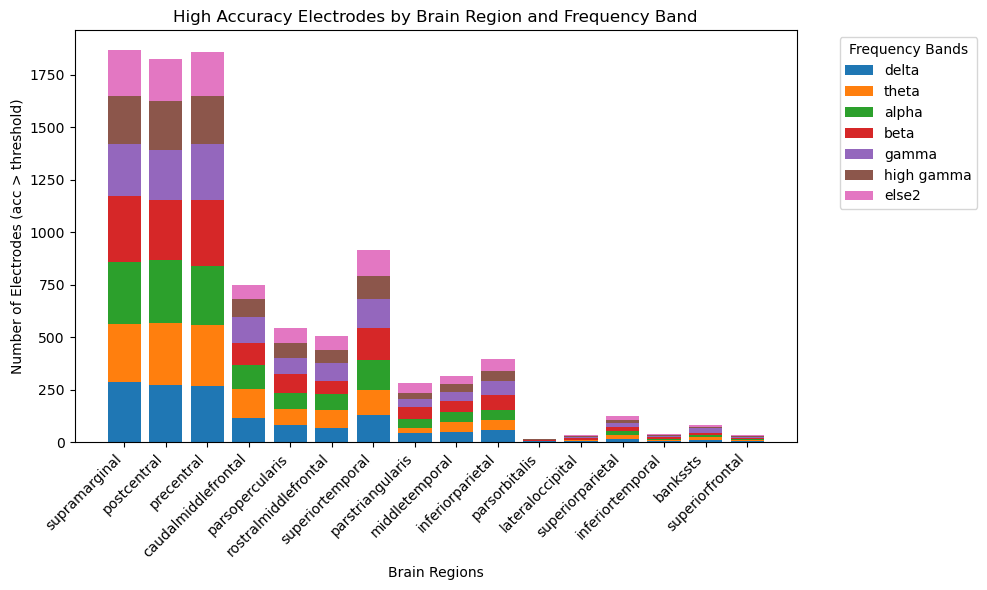

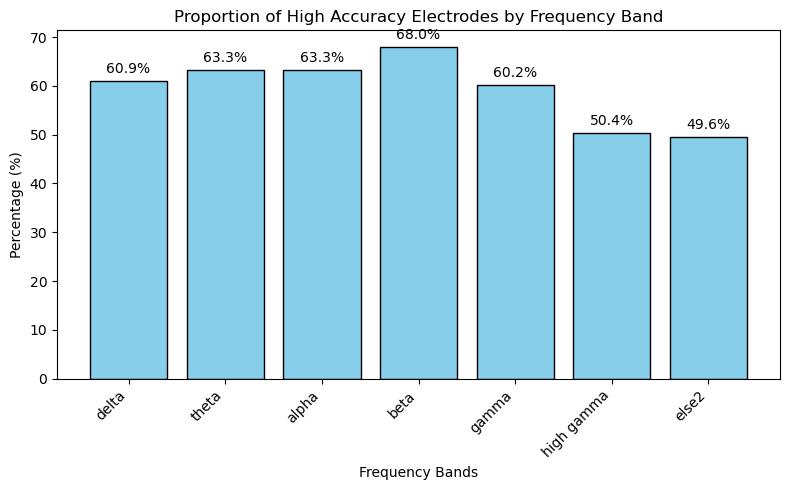

In [42]:
subjects_data = {}
for HS in HS_list:
    for freq in freq_list:
        save_acc_path = f'/public/DATA/covert_reading/bands_acc/HS{HS}/{freq}'
        bands_acc = np.load(os.path.join(save_acc_path, 'bands_acc.npy'), allow_pickle=True).item()
        subjects_data[HS] = bands_acc
        
region_count_by_band, region_high_acc_percentage = analysis_acc_per_band(subjects_data, bands_list, threshold=0.5)
plot_acc_distribution_per_band(region_count_by_band, region_high_acc_percentage)

## 1.4 The percentage of significant electrodes in each brain region relative to the total electrodes in that region for each frequency band

In [38]:
def analysis_acc_per_region(subjects_data, bands_list, threshold=0.5):
    # 初始化统计数据
    region_count_by_band = {band: defaultdict(int) for band in bands_list}
    region_total_count = defaultdict(int)

    # 遍历所有被试，统计数据
    for HS, subject_data in subjects_data.items():
        anatomy = scio.loadmat(f"/public/DATA/covert_reading/elecs/warped/HS{HS}_elecs_all_warped.mat")['anatomy']

        for band, acc_list in subject_data.items():
            for elec, acc in enumerate(acc_list):
                region = anatomy[elec][3][0]  # 获取电极所在的脑区
                region_total_count[region] += 1  # 统计每个脑区的总电极数
                if acc > threshold:  # 筛选高准确率电极
                    region_count_by_band[band][region] += 1

    # 计算比例
    region_high_acc_percentage = {}
    for region in region_total_count:
        high_acc_count = sum(
            region_count_by_band[band].get(region, 0) for band in bands_list
        )
        region_high_acc_percentage[region] = high_acc_count / region_total_count[region]
    return region_count_by_band, region_high_acc_percentage

def plot_acc_distribution_per_region(region_count_by_band, region_high_acc_percentage):
    # 转换为 DataFrame，便于统计和可视化
    df_high_acc = pd.DataFrame(region_count_by_band).fillna(0).T
    df_high_acc_percentage = pd.DataFrame(region_high_acc_percentage, index=["Percentage"]).T

    # 绘制堆叠柱状图（高准确率电极数分布）
    fig, ax = plt.subplots(figsize=(10, 6))
    bottoms = np.zeros(len(df_high_acc.columns))

    for band in df_high_acc.index:
        ax.bar(
            df_high_acc.columns,
            df_high_acc.loc[band],
            bottom=bottoms,
            label=band,
        )
        bottoms += df_high_acc.loc[band]

    plt.xticks(rotation=45, ha="right")
    plt.xlabel("Brain Regions")
    plt.ylabel("Number of Electrodes (acc > threshold)")
    plt.title("High Accuracy Electrodes by Brain Region and Frequency Band")
    plt.legend(title="Frequency Bands", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    plt.show()

    # 绘制每个脑区的高准确率电极比例
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.bar(
        df_high_acc_percentage.index,
        df_high_acc_percentage["Percentage"] * 100,
        color="skyblue",
        edgecolor="black",
    )
    for idx, perc in enumerate(df_high_acc_percentage["Percentage"] * 100):
        ax.text(idx, perc + 1, f"{perc:.1f}%", ha="center", va="bottom")

    plt.xticks(rotation=45, ha="right")
    plt.xlabel("Brain Regions")
    plt.ylabel("Percentage (%)")
    plt.title("Proportion of High Accuracy Electrodes by Brain Region")
    plt.tight_layout()
    plt.show()

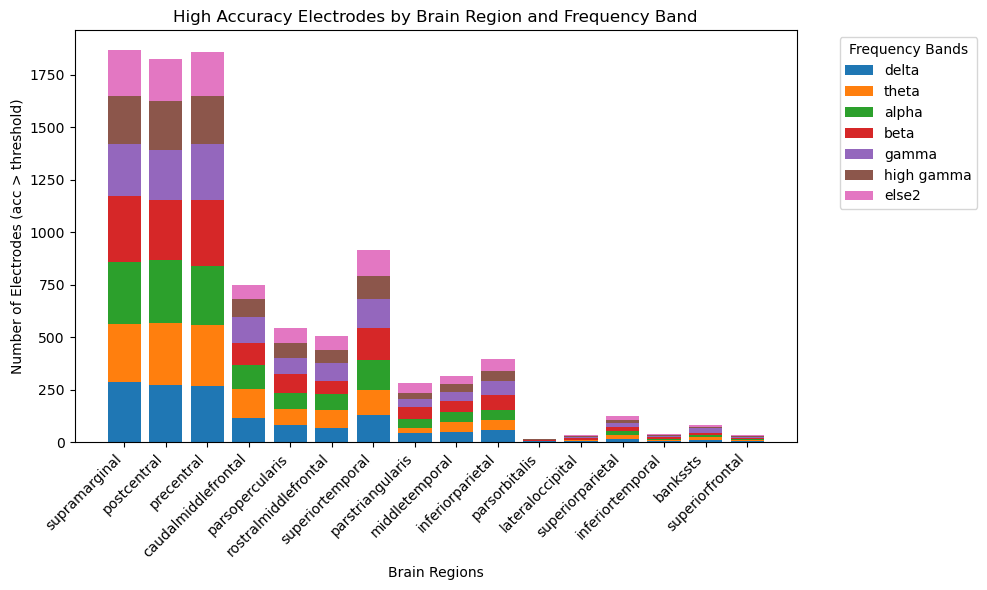

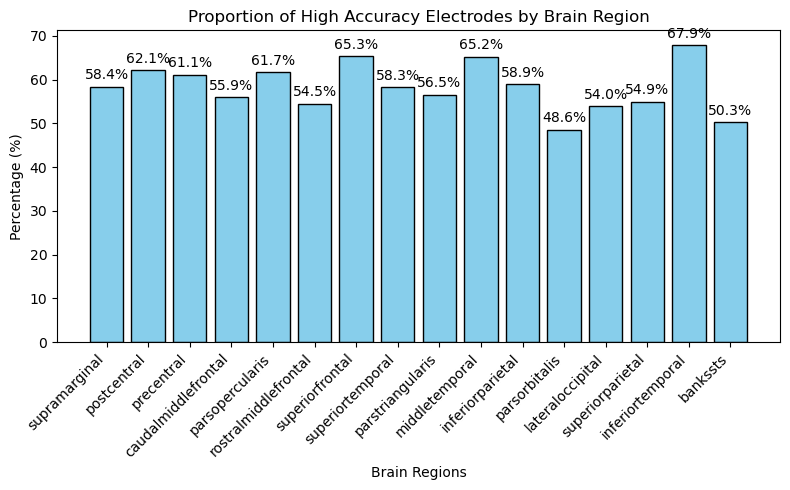

In [39]:
subjects_data = {}
for HS in HS_list:
    for freq in freq_list:
        save_acc_path = f'/public/DATA/covert_reading/bands_acc/HS{HS}/{freq}'
        bands_acc = np.load(os.path.join(save_acc_path, 'bands_acc.npy'), allow_pickle=True).item()
        subjects_data[HS] = bands_acc
        
region_count_by_band, region_high_acc_percentage = analysis_acc_per_region(subjects_data, bands_list, threshold=0.5)
plot_acc_distribution_per_region(region_count_by_band, region_high_acc_percentage)